In [1]:
import warnings, os, pandas as pd, requests, json
from datetime import datetime
warnings.filterwarnings("ignore", category=DeprecationWarning, module=".*")

In [2]:
import matplotlib as mpl
mpl.rcParams['font.family'] = 'Libre Franklin'
mpl.rcParams['figure.dpi'] = 200

We will only use 2000 onwards. For data of 2017 onwards, it is through an API since it is still for an update at a given time.

In [3]:
import geopandas as gpd

maps = gpd.read_file('../data/singapore/maps/1-region.geojson')
maps

,name,geometry
0,CENTRAL REGION,"MULTIPOLYGON (((103.84875 1.36303, 103.84924 1..."
1,EAST REGION,"MULTIPOLYGON (((103.95322 1.38202, 103.9535 1...."
2,NORTH REGION,"MULTIPOLYGON (((103.77664 1.45145, 103.77673 1..."
3,NORTH-EAST REGION,"MULTIPOLYGON (((103.89715 1.41502, 103.89741 1..."
4,WEST REGION,"MULTIPOLYGON (((103.69729 1.30754, 103.69728 1..."


In [4]:
df = pd.read_csv('../data/processed/sg_hdb_2010_2023.csv')

In [5]:
df_sg = df.copy()

In [6]:
# Rename all instances of Multi generation into Multi-generation
df_sg['flat_type'] = df_sg['flat_type'].str.replace('MULTI GENERATION', 'MULTI-GENERATION')

In [7]:
region_groups = {
    'Central': ['BISHAN', 'BUKIT MERAH', 'BUKIT TIMAH', 'CENTRAL AREA', 'GEYLANG', 'KALLANG/WHAMPOA', 'MARINE PARADE', 'NOVENA', 'QUEENSTOWN', 'SOUTHERN ISLANDS', 'TANGLIN', 'TOA PAYOH'],
    'East': ['BEDOK', 'CHANGI', 'CHANGI BAY', 'PASIR RIS', 'PAYA LEBAR', 'TAMPINES'],
    'North': ['CENTRAL WATER CATCHMENT', 'LIM CHU KANG', 'MANDAI', 'SEMBAWANG', 'SIMPANG', 'SUNGEI KADUT', 'WOODLANDS', 'YISHUN'],
    'North-East': ['ANG MO KIO', 'HOUGANG', 'NORTH-EASTERN ISLANDS', 'PUNGGOL', 'SELETAR', 'SENGKANG', 'SERANGOON'],
    'West': ['BOON LAY', 'BUKIT BATOK', 'BUKIT PANJANG', 'CHOA CHU KANG', 'CLEMENTI', 'JURONG WEST', 'JURONG EAST', 'PIONEER', 'TENGAH', 'TUAS', 'WESTERN ISLANDS', 'WESTERN WATER CATCHMENT']
}

df_sg['region'] = df_sg['town'].apply(lambda x: next((group for group, areas in region_groups.items() if x in areas), 'Other'))

In [8]:
maps

,name,geometry
0,CENTRAL REGION,"MULTIPOLYGON (((103.84875 1.36303, 103.84924 1..."
1,EAST REGION,"MULTIPOLYGON (((103.95322 1.38202, 103.9535 1...."
2,NORTH REGION,"MULTIPOLYGON (((103.77664 1.45145, 103.77673 1..."
3,NORTH-EAST REGION,"MULTIPOLYGON (((103.89715 1.41502, 103.89741 1..."
4,WEST REGION,"MULTIPOLYGON (((103.69729 1.30754, 103.69728 1..."


In [9]:
# Rename 'name' column in maps to 'region' (or 'town', if matching df_sg)
maps = maps.rename(columns={'name': 'region'})  # adjust if needed

# Rename the region names in maps to match the ones in df_sg
maps_name_map = {
	'CENTRAL REGION': 'Central',
 	'WEST REGION': 'West',
	'EAST REGION': 'East',
	'NORTH REGION': 'North',
	'NORTH-EAST REGION': 'North-East',
}

maps['region'] = maps['region'].replace(maps_name_map)

# Keep only relevant columns
maps = maps[['region', 'geometry']]

# Merge with your original DataFrame on 'region'
df_sg = df_sg.merge(maps, on='region', how='left')
df_sg

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,Lease Age,region,geometry
0,2010-01-01,ANG MO KIO,2 ROOM,323,ANG MO KIO AVE 3,10 TO 12,44.0,Improved,1977-01-01,202000.0,48,North-East,"MULTIPOLYGON (((103.89715 1.41502, 103.89741 1..."
1,2010-01-01,ANG MO KIO,2 ROOM,314,ANG MO KIO AVE 3,01 TO 03,44.0,Improved,1978-01-01,208000.0,47,North-East,"MULTIPOLYGON (((103.89715 1.41502, 103.89741 1..."
2,2010-01-01,ANG MO KIO,2 ROOM,314,ANG MO KIO AVE 3,07 TO 09,44.0,Improved,1978-01-01,180000.0,47,North-East,"MULTIPOLYGON (((103.89715 1.41502, 103.89741 1..."
3,2010-01-01,ANG MO KIO,2 ROOM,314,ANG MO KIO AVE 3,07 TO 09,44.0,Improved,1978-01-01,180000.0,47,North-East,"MULTIPOLYGON (((103.89715 1.41502, 103.89741 1..."
4,2010-01-01,ANG MO KIO,2 ROOM,323,ANG MO KIO AVE 3,01 TO 03,44.0,Improved,1977-01-01,198000.0,48,North-East,"MULTIPOLYGON (((103.89715 1.41502, 103.89741 1..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
355068,2025-02-01,YISHUN,EXECUTIVE,723,YISHUN ST 71,07 TO 09,146.0,Maisonette,1986-01-01,818888.0,39,North,"MULTIPOLYGON (((103.77664 1.45145, 103.77673 1..."
355069,2025-01-01,YISHUN,EXECUTIVE,836,YISHUN ST 81,01 TO 03,146.0,Maisonette,1988-01-01,960000.0,37,North,"MULTIPOLYGON (((103.77664 1.45145, 103.77673 1..."
355070,2025-02-01,YISHUN,EXECUTIVE,824,YISHUN ST 81,01 TO 03,145.0,Apartment,1987-01-01,868888.0,38,North,"MULTIPOLYGON (((103.77664 1.45145, 103.77673 1..."
355071,2025-02-01,YISHUN,EXECUTIVE,826,YISHUN ST 81,10 TO 12,146.0,Maisonette,1988-01-01,1100888.0,37,North,"MULTIPOLYGON (((103.77664 1.45145, 103.77673 1..."


## EDA

### 1. Historical trends in resale prices (flat types and regions)

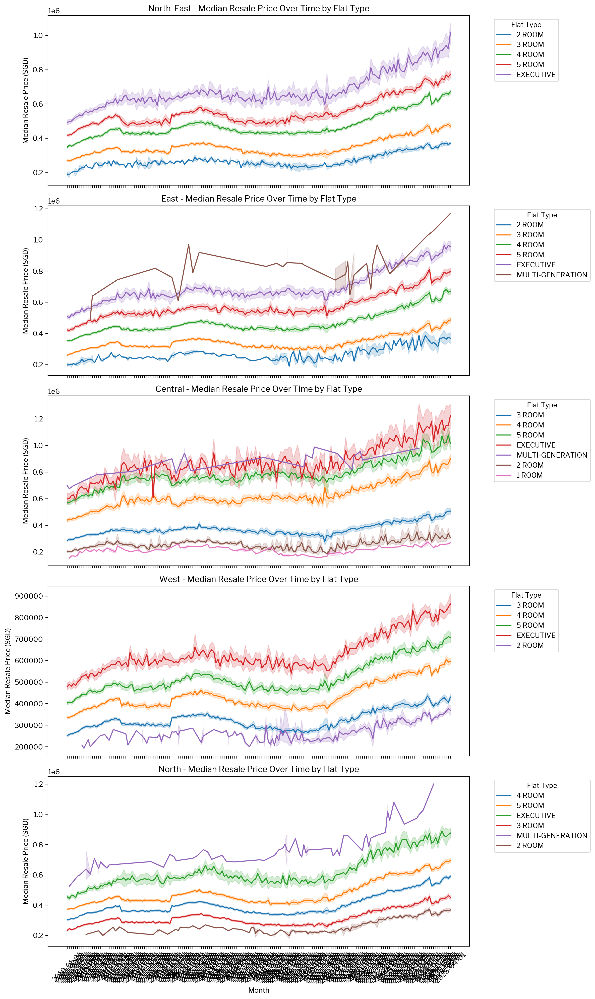

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get unique regions
regions = df_sg['region'].unique()
df_sg.sort_values(by='region', ascending=True)
n = len(regions)

# Create subplots
fig, axes = plt.subplots(nrows=n, figsize=(12, 4 * n), sharex=True)

# If only one region, make axes iterable
if n == 1:
    axes = [axes]

# Plot for each region
for i, region in enumerate(regions):
    ax = axes[i]
    df_subset = df_sg[df_sg['region'] == region]

    sns.lineplot(
        data=df_subset,
        x='month',
        y='resale_price',
        hue='flat_type',
        ax=ax
    )
    ax.set_title(f"{region} - Median Resale Price Over Time by Flat Type")
    ax.set_xlabel('Month')
    ax.set_ylabel('Median Resale Price (SGD)')
    ax.legend(title='Flat Type', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

In [11]:
# Mean resale price by region and flat type
mean_resale_price = df_sg.groupby(['month', 'region', 'flat_type'])['resale_price'].mean().reset_index()
mean_resale_price = mean_resale_price.sort_values(by='resale_price', ascending=True)
mean_resale_price = mean_resale_price.pivot(index=['month', 'region'], columns=['flat_type'], values='resale_price').reset_index()
mean_resale_price

flat_type,month,region,1 ROOM,2 ROOM,3 ROOM,4 ROOM,5 ROOM,EXECUTIVE,MULTI-GENERATION
0,2010-01-01,Central,NaN,201556.769231,285914.911111,439012.515337,5.683116e+05,5.981750e+05,698000.0
1,2010-01-01,East,NaN,197666.666667,260636.751880,353269.148148,4.227714e+05,5.078564e+05,NaN
2,2010-01-01,North,NaN,NaN,233348.210526,302733.398230,3.735341e+05,4.553395e+05,NaN
3,2010-01-01,North-East,NaN,191500.000000,271174.000000,347648.438144,4.179691e+05,4.930113e+05,NaN
4,2010-01-01,West,NaN,NaN,250923.634146,336484.344595,4.030175e+05,4.790703e+05,NaN
...,...,...,...,...,...,...,...,...,...
915,2025-04-01,Central,270000.0,306577.600000,506764.975000,901551.512987,1.013618e+06,1.225270e+06,NaN
916,2025-04-01,East,NaN,369200.000000,486566.933333,670743.814516,7.979105e+05,9.566770e+05,1170000.0
917,2025-04-01,North,NaN,368194.400000,451307.753086,591012.013761,6.948017e+05,8.761993e+05,NaN
918,2025-04-01,North-East,NaN,370592.533333,470991.009174,671174.838095,7.730498e+05,1.015287e+06,NaN


### 2. Geographical disparity in housing prices per region (flat type and model)

In [12]:
df_copsg = df_sg.copy()

df_copsg = df_copsg.sort_values(['region', 'flat_type', 'month'])

# 1. Calculate monthly % change
df_copsg['pct_change'] = df_copsg.groupby(['region'])['resale_price'].pct_change()

# 2. Compute average monthly % change (drop NaNs)
avg_pct = (
    df_copsg.dropna(subset=['pct_change'])
         .groupby(['region'])['pct_change']
         .mean()
         .reset_index()
         .rename(columns={'pct_change': 'avg_monthly_pct_change'})
)

# 3. Compute relative change from first to last month
price_change = (
    df_copsg.groupby(['region'])['resale_price']
         .agg(first_price='first', last_price='last')
         .reset_index()
)
price_change['relative_change'] = (
    (price_change['last_price'] - price_change['first_price']) / price_change['first_price']
)

# 4. Multiply changes by 100
avg_pct['avg_monthly_pct_change'] *= 100

# 5. Merge both summaries
change_summary = pd.merge(avg_pct, price_change, on='region')

# 6. (Optional) Add geometry
maps = maps.rename(columns={'name': 'region'})[['region', 'geometry']]
change_summary = change_summary.merge(maps, on='region', how='left')

# 7. Convert to GeoDataFrame (if geometry is needed)
gdf_change = gpd.GeoDataFrame(change_summary, geometry='geometry')

In [13]:
# change_summary

<Figure size 2400x1600 with 0 Axes>

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


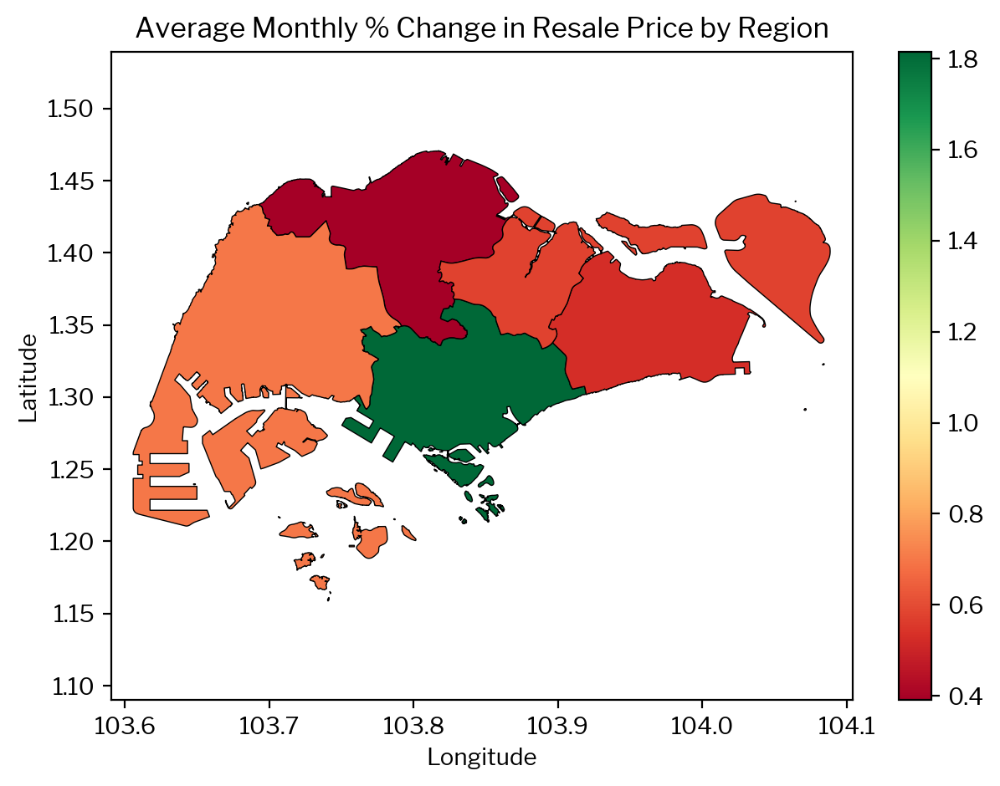

In [14]:
plt.figure(figsize=(12, 8))

gdf_change.plot(
        column='avg_monthly_pct_change',
        cmap='RdYlGn',  # Red (decline) → Green (growth)
        legend=True,
        edgecolor='black',
        linewidth=0.5)

plt.title('Average Monthly % Change in Resale Price by Region')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.axis('equal')  # keeps aspect ratio correct

# Range should be 0 to 2 for better color representation (color bar)
plt.xlim(gdf_change.total_bounds[[0, 2]])

plt.tight_layout()
plt.show()

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


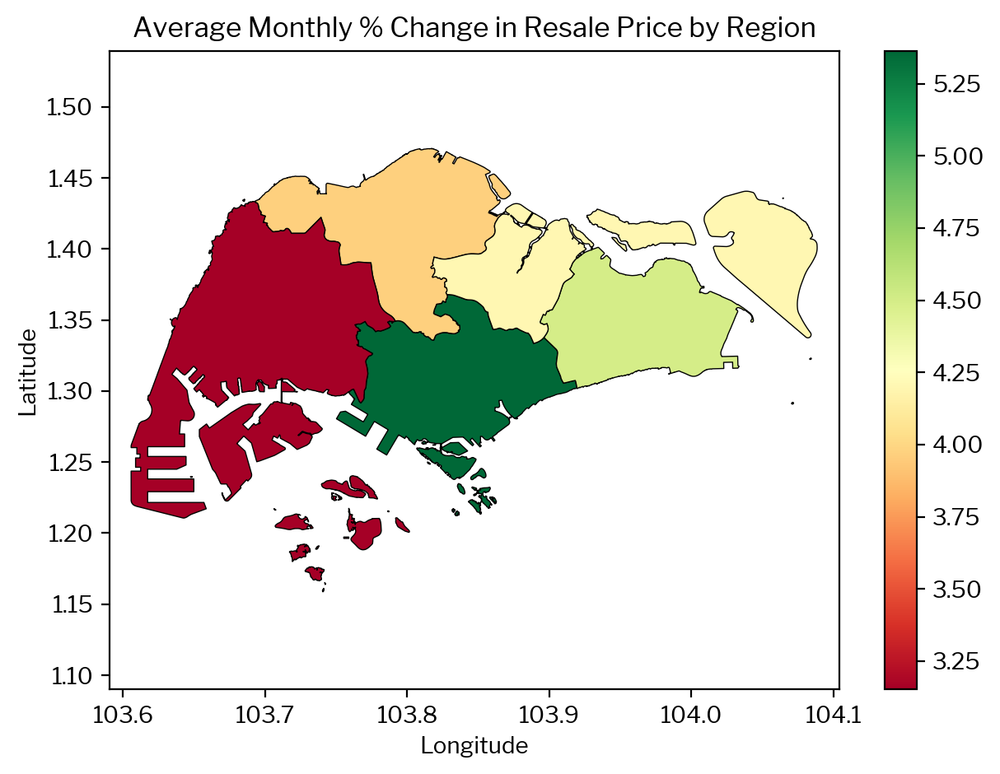

In [15]:
gdf_change.plot(
        column='relative_change',
        cmap='RdYlGn',  # Red (decline) → Green (growth)
        legend=True,
        edgecolor='black',
        linewidth=0.5)

plt.title('Average Monthly % Change in Resale Price by Region')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.axis('equal')  # keeps aspect ratio correct

# Range should be 0 to 2 for better color representation (color bar)
plt.xlim(gdf_change.total_bounds[[0, 2]])

plt.tight_layout()
plt.show()

### 3. Distribution of flat types in data per region

In [17]:
import plotly.express as px
import pandas as pd

# Ensure month is in string format
df_plot = df_sg.copy()
df_plot['month'] = pd.to_datetime(df_plot['month'])  # Convert to datetime
df_plot['month'] = df_plot['month'].dt.strftime('%Y-%m')  # Format as string

# Count listings per region, per month, per flat_type
df_counts = df_plot.groupby(['region', 'month', 'flat_type']).size().reset_index(name='count')

# Pivot flat_types into columns (to calculate row-wise percentage)
df_pivot = df_counts.pivot_table(index=['region', 'month'], columns='flat_type', values='count', fill_value=0)

# Normalize each row to sum to 1 (relative % within each region-month)
df_percent = df_pivot.div(df_pivot.sum(axis=1), axis=0).reset_index()

# Melt back to long format for Plotly
df_melted = df_percent.melt(id_vars=['region', 'month'], var_name='flat_type', value_name='percentage')

# Plot: One subplot per region
fig = px.area(
    df_melted,
    x='month',
    y='percentage',
    color='flat_type',
    facet_row='region',  # one plot per region
    color_discrete_sequence=px.colors.sequential.Plasma,
    category_orders={"month": sorted(df_melted['month'].unique())}
)

# Format
fig.update_layout(
    height=3000,  # Adjust depending on number of regions
    title='Relative Flat Type Distribution Over Time by Region',
    yaxis_tickformat='.0%',
    xaxis_title='Month',
    yaxis_title='Proportion of Listings',
    legend_title='Flat Type'
)

fig.show()

### 4. Relationship: Property age and resale price (diff flat types, region-wise too)

c:\Users\Ebo\miniconda3\envs\brigadeiro\Lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide



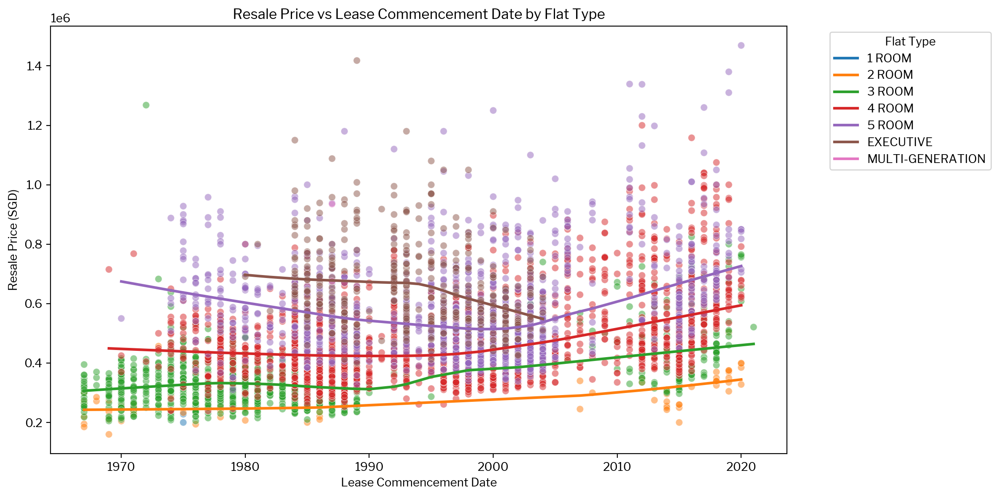

In [19]:
# Sns for scatterplot

import seaborn as sns
import matplotlib.pyplot as plt

# Calculate sample size per group (proportional)
sample_size = 5000
strata = df_sg['flat_type']
grouped = df_sg.groupby(strata, group_keys=False)

# Proportional sampling
df_sampled = grouped.apply(lambda x: x.sample(frac=sample_size / len(df_sg), random_state=166))

df_sampled = df_sampled.reset_index(drop=True).sort_values(by='flat_type')

plt.figure(figsize=(12, 6))

# Ensure lease_commence_date is in datetime format
df_sampled['lease_commence_date'] = pd.to_datetime(df_sampled['lease_commence_date'], errors='coerce')

# Convert lease_commence_date to year for plotting
df_sampled['lease_commence_year'] = df_sampled['lease_commence_date'].dt.year

sns.scatterplot(
    data=df_sampled,
    x='lease_commence_year',
    y='resale_price',
    hue='flat_type',
    alpha=0.5,
    legend=False  # Hide to prevent duplication with regplot
)

# Add LOESS regression lines per flat_type
flat_types = df_sampled['flat_type'].unique()
for flat in flat_types:
    subset = df_sampled[df_sampled['flat_type'] == flat]
    sns.regplot(
        data=subset,
        x='lease_commence_year',
        y='resale_price',
        scatter=False,
        lowess=True,
        label=flat
    )
    
plt.title('Resale Price vs Lease Commencement Date by Flat Type')
plt.xlabel('Lease Commencement Date')
plt.ylabel('Resale Price (SGD)')
plt.legend(title='Flat Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

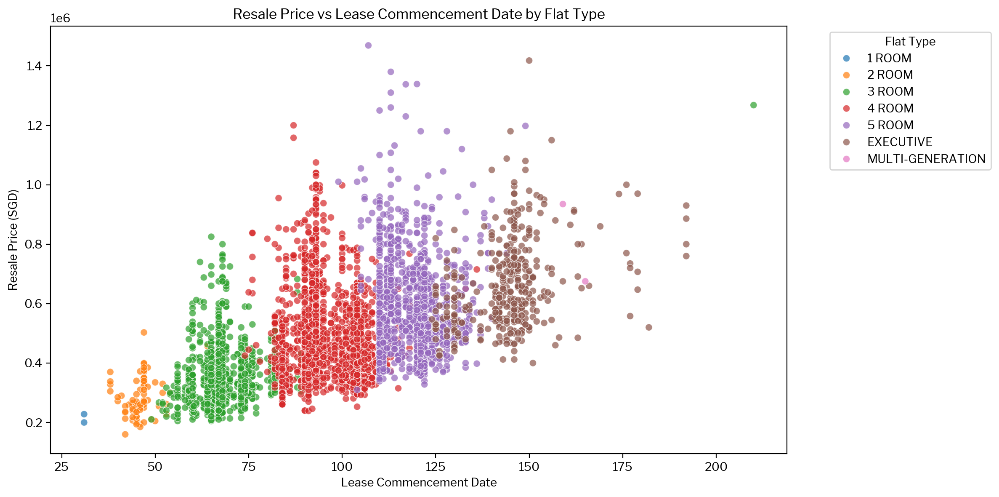

In [20]:
# Sns for scatterplot

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

sns.scatterplot(data=df_sampled, x='floor_area_sqm', y='resale_price', hue='flat_type', alpha=0.7)
plt.title('Resale Price vs Lease Commencement Date by Flat Type')
plt.xlabel('Lease Commencement Date')
plt.ylabel('Resale Price (SGD)')
plt.legend(title='Flat Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()